In [1]:
!apt update && apt install -y libpq-dev libsdl2-dev swig xorg-dev xvfb
%pip install -U pyvirtualdisplay
%pip install -U gym[box2d,atari,accept-rom-license]

import tensorflow as tf
from tensorflow import keras

import numpy as np
import os

np.random.seed(42)
tf.random.set_seed(42)

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

PROJECT_ROOT_DIR = "."
CHAPTER_ID = "rl"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:2 https://deb.nodesource.com/node_16.x focal InRelease                     
Hit:3 http://archive.ubuntu.com/ubuntu focal InRelease                     
Hit:4 http://security.ubuntu.com/ubuntu focal-security InRelease    
Hit:5 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:6 http://archive.ubuntu.com/ubuntu focal-updates InRelease
Hit:7 http://archive.ubuntu.com/ubuntu focal-backports InRelease
Reading package lists... Done
Building dependency tree       
Reading state information... Done
73 packages can be upgraded. Run 'apt list --upgradable' to see them.
E: dpkg was interrupted, you must manually run 'dpkg --configure -a' to correct the problem. 
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import gym
import pyvirtualdisplay
import random
from collections import deque
display = pyvirtualdisplay.Display(visible=0, size=(1400, 900)).start()
from tqdm import tqdm_notebook
keras.backend.set_image_data_format('channels_first')
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
game_name = "FreewayDeterministic-v4"

env = gym.make(game_name, full_action_space = False, render_mode = 'rgb_array')

A.L.E: Arcade Learning Environment (version 0.8.1+53f58b7)
[Powered by Stella]


In [4]:
input_shape = (4, 84, 84)
batch_size = 32
discount_rate = 0.99
n_outputs = env.action_space.n
num_frames = 500000
replay_start_size = num_frames / 200
epsilon = 1
#0.2
epsilon_min = 0.2
#eps linear decay for 1/10 of run
eps_linear_decay = (epsilon-epsilon_min)/(num_frames/10)

replay_memory = deque(maxlen=80000)

In [5]:
env.action_space.seed(42)
obs = env.reset()[0]
env.unwrapped.get_action_meanings()

['NOOP', 'UP', 'DOWN']

In [6]:
def plot_environment(env, figsize=(5,4)):
    plt.figure(figsize=figsize)
    img = env.render()
    plt.imshow(img)
    plt.axis("off")
    return img

/usr/local/lib/python3.9/dist-packages/gym/utils/passive_env_checker.py:289: UserWarning: WARN: No render fps was declared in the environment (env.metadata['render_fps'] is None or not defined), rendering may occur at inconsistent fps.
  logger.warn(


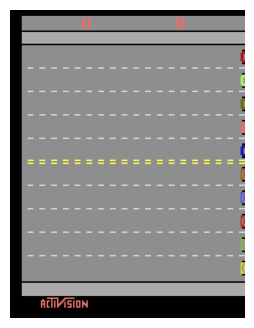

In [7]:
plot_environment(env)
plt.show()

In [8]:
env.action_space

Discrete(3)

In [9]:
def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

In [10]:
frames = []
score = 0

obs = env.reset()[0]
for step in range(600):
    img = env.render()
    frames.append(img)
    action = env.action_space.sample()

    obs, reward, terminated, truncated, info = env.step(action)
    score += reward
    if terminated or truncated:
        break
print(score)
plot_animation(frames)

0.0


# Deep Q-Network

In [11]:
import numpy as np
import cv2

def preprocess_frame(screen, exclude, output):
    """Preprocess Image.
        
        Params
        ======
            screen (array): RGB Image
            exclude (tuple): Section to be croped (UP, RIGHT, DOWN, LEFT)
            output (int): Size of output image
        """
    # TConver image to gray scale
    screen = cv2.cvtColor(screen, cv2.COLOR_RGB2GRAY)
    
    #Crop screen[Up: Down, Left: right] 
    screen = screen[exclude[0]:exclude[2], exclude[3]:exclude[1]]
    
    # Convert to float, and normalized
    screen = np.ascontiguousarray(screen, dtype=np.float32) / 255
    
    # Resize image to 84 * 84
    screen = cv2.resize(screen, (output, output), interpolation = cv2.INTER_AREA)
    return screen

def stack_frame(stacked_frames, frame):
    stacked_frames[0] = stacked_frames[1]
    stacked_frames[1] = stacked_frames[2]
    stacked_frames[2] = stacked_frames[3]
    stacked_frames[3] = frame
    
    return stacked_frames

# def ncwh_to_nwhc(tensor):
#     return tf.transpose(tensor, [0, 2, 3, 1])

In [12]:
def epsilon_greedy_policy(state, epsilon=0.05):
    if np.random.rand() < epsilon:
        return np.random.randint(n_outputs)
    else:
        state_tensor = tf.convert_to_tensor(state)
        state_tensor = tf.expand_dims(state_tensor, 0)
        action_probs = model(state_tensor, training=False)
        action = tf.argmax(action_probs[0]).numpy()
        return action

In [13]:
def sample_experiences(batch_size):
    batch = random.sample(replay_memory, batch_size)
    states, actions, rewards, next_states, terminated = [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(5)]
    return states, actions, rewards, next_states, terminated

In [14]:
def play_one_step(env, state_stack, epsilon):
    action = epsilon_greedy_policy(state_stack, epsilon)
    next_state, reward, terminated, truncated, info = env.step(action)
    next_state = preprocess_frame(next_state, [15, 160, 195, 8], 84)
    next_state_stack = np.copy(state_stack)
    next_state_stack = stack_frame(next_state_stack, next_state)
    replay_memory.append((state_stack, action, reward, next_state_stack, terminated))
    return next_state_stack, reward, terminated, truncated

In [15]:
optimizer = keras.optimizers.Adam(learning_rate=0.00025)
loss_fn = keras.losses.Huber()

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, terminated = experiences
    next_Q_values = model.predict(next_states, verbose=0)
    max_next_Q_values = np.max(next_Q_values, axis=1)
    target_Q_values = (rewards +
                       (1 - terminated) * discount_rate * max_next_Q_values)
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model(states, training=False)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
        Qs.append(np.mean(Q_values))
        losses.append(loss)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

In [16]:
env.action_space.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

episode = 0
best_score = 0
step_count = 0
scores = []
losses = []
Qs = []

In [17]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

env = gym.make(game_name, full_action_space = False, render_mode = 'rgb_array')


model = keras.models.Sequential([
    keras.layers.InputLayer(input_shape = input_shape),
    keras.layers.Conv2D(16, kernel_size=(8, 8), strides=4, activation="relu"),
    keras.layers.Conv2D(32, kernel_size=(4, 4), strides=2, activation="relu"),
    keras.layers.Conv2D(32, kernel_size=(3, 3), strides=1, activation="relu"),
    keras.layers.Flatten(),
    keras.layers.Dense(256, activation="relu"),
    keras.layers.Dense(n_outputs, activation='linear'),
])

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 20, 20)        4112      
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 9, 9)          8224      
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 7, 7)          9248      
                                                                 
 flatten (Flatten)           (None, 1568)              0         
                                                                 
 dense (Dense)               (None, 256)               401664    
                                                                 
 dense_1 (Dense)             (None, 3)                 771       
                                                                 
Total params: 424,019
Trainable params: 424,019
Non-trai

In [19]:
while step_count < num_frames:
    obs = env.reset()[0]
    score = 0
    obs = preprocess_frame(obs, [15, 160, 195, 8], 84)
    obs_stack = np.stack(arrays=[obs, obs, obs, obs])
    for step in range(10000):
        epsilon = max(epsilon - eps_linear_decay, epsilon_min)
        obs_stack, reward, terminated, truncated = play_one_step(env, obs_stack, epsilon)
        score += reward
        if terminated or truncated:
            break
    scores.append(score)
    step_count += step
    episode += 1
    if step_count > replay_start_size:
        training_step(batch_size)
    if episode % 5 == 0 or step_count >= num_frames:
        print("Episode: {}, Steps: {}, eps: {:.3f}, Score: {}, frames: {}, loss: {:.15f}".format(episode, step + 1, epsilon, np.mean(scores[-5:]), step_count, np.mean(losses[-5:])), end="\n")
    if score >= best_score:
        best_weights = model.get_weights()
        best_score = score

model.set_weights(best_weights)

Episode: 5, Steps: 2048, eps: 0.836, Score: 0.0, frames: 10235, loss: 0.003753341268748
Episode: 10, Steps: 2048, eps: 0.672, Score: 2.4, frames: 20470, loss: 0.000828989897855
Episode: 15, Steps: 2048, eps: 0.508, Score: 2.4, frames: 30705, loss: 0.000751070561819
Episode: 20, Steps: 2048, eps: 0.345, Score: 5.4, frames: 40940, loss: 0.005459500476718
Episode: 25, Steps: 2048, eps: 0.200, Score: 6.8, frames: 51175, loss: 0.004520458169281
Episode: 30, Steps: 2048, eps: 0.200, Score: 4.0, frames: 61410, loss: 0.007743152789772
Episode: 35, Steps: 2048, eps: 0.200, Score: 0.0, frames: 71645, loss: 0.009800076484680
Episode: 40, Steps: 2048, eps: 0.200, Score: 7.6, frames: 81880, loss: 0.008221448399127
Episode: 45, Steps: 2048, eps: 0.200, Score: 3.8, frames: 92115, loss: 0.005789280403405
Episode: 50, Steps: 2048, eps: 0.200, Score: 3.2, frames: 102350, loss: 0.031812451779842
Episode: 55, Steps: 2048, eps: 0.200, Score: 0.0, frames: 112585, loss: 0.003965501673520
Episode: 60, Steps: 

Saving figure dqn_rewards_plot


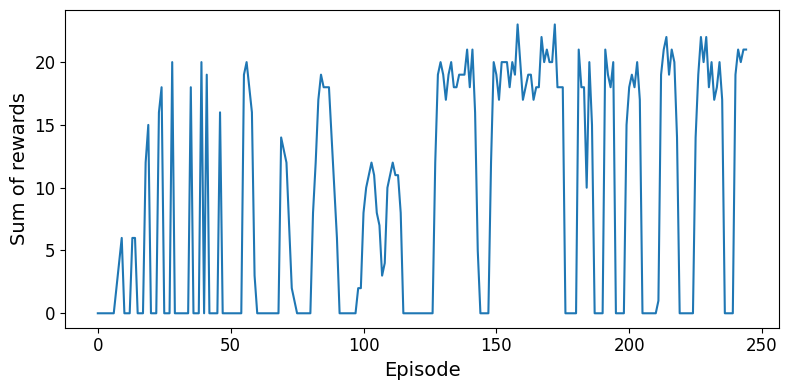

In [20]:
plt.figure(figsize=(8, 4))
plt.plot(scores)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
save_fig("dqn_rewards_plot")
plt.show()

Saving figure dqn_losses_plot


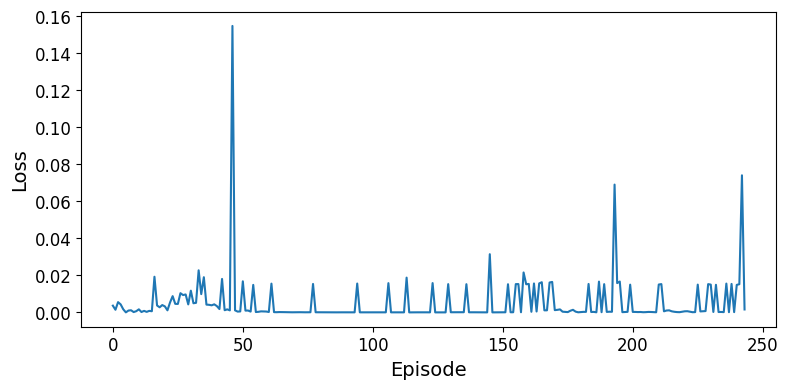

In [21]:
plt.figure(figsize=(8, 4))
plt.plot(losses)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Loss", fontsize=14)
save_fig("dqn_losses_plot")
plt.show()

Saving figure dqn_Q_plot


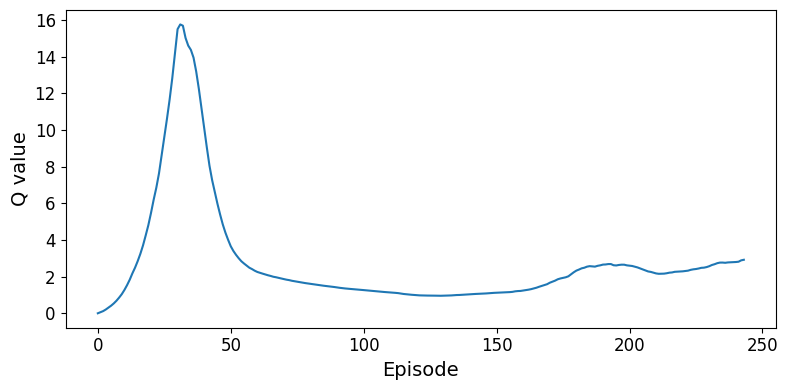

In [22]:
plt.figure(figsize=(8, 4))
plt.plot(Qs)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Q value", fontsize=14)
save_fig("dqn_Q_plot")
plt.show()

In [23]:
model.save('tmp_model')

INFO:tensorflow:Assets written to: tmp_model/assets


INFO:tensorflow:Assets written to: tmp_model/assets


In [24]:
model = keras.models.load_model('tmp_model')

In [ ]:
env.action_space.seed(42)
state = env.reset()[0]
state_1st = preprocess_frame(state, [15, 160, 195, 8], 84)
state_stack = np.stack(arrays=[state_1st, state_1st, state_1st, state_1st])

frames = []
score = 0

while True:
    state = preprocess_frame(state, [15, 160, 195, 8], 84)
    state_stack = stack_frame(state_stack, state)
    action = epsilon_greedy_policy(state_stack, 0.05)
    state, reward, terminated, truncated, info = env.step(action)
    score += reward
    if terminated or truncated:
        break
    img = env.render()
    frames.append(img)

print(score)
plot_animation(frames)